# **Cross-Selling Package Recommendation System - Random Forest Model**

**Import libraries**

In [71]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt # data visualization
import seaborn as sns # statistical data visualization

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.tree import export_graphviz
import pydot
import datetime

In [5]:
!pip install pandas pandas-profiling

In [3]:
from ydata_profiling import ProfileReport

In [4]:
import warnings

warnings.filterwarnings('ignore')

**Import Dataset**

In [6]:
data = pd.read_csv('/content/slt_data_final_dataset.csv')

**Exploratoray Data Analysis**

In [7]:
data.shape

(131075, 17)

In [8]:
data.head()

,ACCOUNT_NUM.hash,PROD_ACTION,ADDING_PROMO,Deleting_PROMO,Age,PRODUCT_NAME,CATOGORY,Package_duration,Voice_offnet_call_duration,voice_onnet_call_duration,voice_local_duration,voice_IDD_call_duration,Used_data_GB,extraGB_amount,peo_package,additional_event_cost,peo_TV_charge
0,00014242733be1eedbbf7103844b5493,NaN,NaN,NaN,NaN,NaN,DOUBLE_PLAY_VOICE_BB,0,0,0,0,22,102.334588,8,0,0,0
1,000207c7e2cf6cc4d0f9f3dac1964ce8,NaN,NaN,NaN,NaN,NaN,DOUBLE_PLAY_VOICE_BB,0,0,0,0,0,457.914000,0,0,0,0
2,000289936e98153c62eed15a700980f1,NaN,NaN,NaN,NaN,NaN,DOUBLE_PLAY_VOICE_BB,0,0,0,0,0,331.441000,0,0,0,0
3,00028e1245a6927bac19e21826502116,NaN,NaN,NaN,NaN,NaN,TRIPLE_PLAY,0,0,0,0,0,420.018555,84,1125,3130,4255
4,0002b64d0a437e49ea7b5468c6610918,NaN,NaN,NaN,NaN,NaN,TRIPLE_PLAY,0,0,0,0,1610,747.546000,0,1875,6525,8400


In [9]:
report = ProfileReport(data)

In [10]:
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
# check duplication values in variables
data.nunique()

ACCOUNT_NUM.hash              131075
PROD_ACTION                        4
ADDING_PROMO                      12
Deleting_PROMO                    13
Age                              103
PRODUCT_NAME                       3
CATOGORY                           4
Package_duration                1870
Voice_offnet_call_duration     21113
voice_onnet_call_duration      31044
voice_local_duration           37816
voice_IDD_call_duration         4606
Used_data_GB                   57092
extraGB_amount                   719
peo_package                        7
additional_event_cost           3643
peo_TV_charge                   3972
dtype: int64

In [11]:
# check missing values in variables

data.isnull().sum()

ACCOUNT_NUM.hash                   0
PROD_ACTION                   102163
ADDING_PROMO                  103565
Deleting_PROMO                103566
Age                            92388
PRODUCT_NAME                   90235
CATOGORY                           0
Package_duration                   0
Voice_offnet_call_duration         0
voice_onnet_call_duration          0
voice_local_duration               0
voice_IDD_call_duration            0
Used_data_GB                       0
extraGB_amount                     0
peo_package                        0
additional_event_cost              0
peo_TV_charge                      0
dtype: int64

In [13]:
#precentage of missing values

(data.isnull().sum()/(len(data)))*100

ACCOUNT_NUM.hash               0.000000
PROD_ACTION                   77.942399
ADDING_PROMO                  79.012016
Deleting_PROMO                79.012779
Age                           70.484837
PRODUCT_NAME                  68.842266
CATOGORY                       0.000000
Package_duration               0.000000
Voice_offnet_call_duration     0.000000
voice_onnet_call_duration      0.000000
voice_local_duration           0.000000
voice_IDD_call_duration        0.000000
Used_data_GB                   0.000000
extraGB_amount                 0.000000
peo_package                    0.000000
additional_event_cost          0.000000
peo_TV_charge                  0.000000
dtype: float64

**Data Preparation**

In [14]:
data['CATOGORY'] = data['CATOGORY'].replace({'DOUBLE_PLAY_VOICE_BB':2 , 'DOUBLE_PLAY_VOICE_PEO':22 ,'SINGLE_PLAY':1,'TRIPLE_PLAY':3})

In [15]:
data.head(10)

,ACCOUNT_NUM.hash,PROD_ACTION,ADDING_PROMO,Deleting_PROMO,Age,PRODUCT_NAME,CATOGORY,Package_duration,Voice_offnet_call_duration,voice_onnet_call_duration,voice_local_duration,voice_IDD_call_duration,Used_data_GB,extraGB_amount,peo_package,additional_event_cost,peo_TV_charge
0,00014242733be1eedbbf7103844b5493,NaN,NaN,NaN,NaN,NaN,2,0,0,0,0,22,102.334588,8,0,0,0
1,000207c7e2cf6cc4d0f9f3dac1964ce8,NaN,NaN,NaN,NaN,NaN,2,0,0,0,0,0,457.914000,0,0,0,0
2,000289936e98153c62eed15a700980f1,NaN,NaN,NaN,NaN,NaN,2,0,0,0,0,0,331.441000,0,0,0,0
3,00028e1245a6927bac19e21826502116,NaN,NaN,NaN,NaN,NaN,3,0,0,0,0,0,420.018555,84,1125,3130,4255
4,0002b64d0a437e49ea7b5468c6610918,NaN,NaN,NaN,NaN,NaN,3,0,0,0,0,1610,747.546000,0,1875,6525,8400
5,000397ece312a702e4915c1d90f0f9f2,NaN,NaN,NaN,NaN,NaN,22,0,3000,0,3000,0,0.000000,20,1125,0,1125
6,0003b3f2143a7051fa8a06cfb22ee475,NaN,NaN,NaN,NaN,NaN,1,0,0,0,0,0,0.000000,5,0,0,0
7,00042f1393bab2f7c6a349834815eb5a,NaN,NaN,NaN,NaN,NaN,3,0,0,0,0,0,229.061285,0,1125,2400,3525
8,000440540ef7c4fc149d45aed58e62cf,NaN,NaN,NaN,62,V_SLT Voice Service,1,1896,42600,0,42600,0,0.000000,0,0,0,0
9,0005857c1fced47f7d9300bcef46e83e,NaN,NaN,NaN,NaN,NaN,2,0,0,0,0,0,517.643000,99,0,4000,4000


In [16]:
#Statistics summary
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ACCOUNT_NUM.hash,131075,131075,00014242733be1eedbbf7103844b5493,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PROD_ACTION,28912,4,Update,25578,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ADDING_PROMO,27510,12,SLT Megaline Triple Play Package,12784,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deleting_PROMO,27509,13,SLT Megaline Single Play Package,11518,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Age,38687,103,51,1131,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PRODUCT_NAME,40840,3,V_SLT Voice Service,23357,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CATOGORY,131075.0,NaN,NaN,NaN,5.896922,8.09047,1.0,1.0,2.0,3.0,22.0
Package_duration,131075.0,NaN,NaN,NaN,371.995743,639.296229,0.0,0.0,0.0,606.0,3336.0
Voice_offnet_call_duration,131075.0,NaN,NaN,NaN,33565.125272,86763.00292,0.0,0.0,0.0,24360.0,3924360.0
voice_onnet_call_duration,131075.0,NaN,NaN,NaN,32616.613847,89771.052216,0.0,0.0,0.0,10184.5,3770354.0


In [17]:
# view categorical & numerical variables

cat_cols = data.select_dtypes(include=['object']).columns.tolist()
num_cols = data.select_dtypes(include=np.number).columns.tolist()
print("Categrical Variables: ", cat_cols)
print('')
print("Numerical Variables: ", num_cols)

Categrical Variables:  ['ACCOUNT_NUM.hash', 'PROD_ACTION', 'ADDING_PROMO', 'Deleting_PROMO', 'Age', 'PRODUCT_NAME']

Numerical Variables:  ['CATOGORY', 'Package_duration', 'Voice_offnet_call_duration', 'voice_onnet_call_duration', 'voice_local_duration', 'voice_IDD_call_duration', 'Used_data_GB', 'extraGB_amount', 'peo_package', 'additional_event_cost', 'peo_TV_charge']


In [26]:
#create a new dataframe

columns = ['Package_duration', 'voice_local_duration', 'Used_data_GB' , 'extraGB_amount' , 'peo_TV_charge','CATOGORY']  # Specify relevant column names

df = data[columns].copy()  # Create a new DataFrame with only relevant columns

In [27]:
df.head()

,Package_duration,voice_local_duration,Used_data_GB,extraGB_amount,peo_TV_charge,CATOGORY
0,0,0,102.334588,8,0,2
1,0,0,457.914000,0,0,2
2,0,0,331.441000,0,0,2
3,0,0,420.018555,84,4255,3
4,0,0,747.546000,0,8400,3


**Declare feature vector & target variable**

In [29]:
# Define X (features) and y (target)

X = df.drop(['CATOGORY'], axis=1)
y = df['CATOGORY']

**Split data into separate training and test set**

In [30]:
# split data into training and testing sets

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 42)

In [31]:
# check the shape of X_train and X_test

X_train.shape, X_test.shape

((87820, 5), (43255, 5))

**Random Forest Classifier model with parameter n_estimators=10**

In [49]:
# import Random Forest classifier
from sklearn.ensemble import RandomForestClassifier

# instantiate the classifier
rfc = RandomForestClassifier(n_estimators=10, random_state=0)

# fit the model
rfc.fit(X_train, y_train)

# Predict the Test set results
y_pred = rfc.predict(X_test)

# Check accuracy score
from sklearn.metrics import accuracy_score

print('Model accuracy score with 10 decision-trees : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with 10 decision-trees : 0.8531


Here, y_test are the true class labels and y_pred are the predicted class labels in the test-set.

Here, I have build the Random Forest Classifier model with default parameter of n_estimators = 10. So, I have used 10 decision-trees to build the model. Now, I will increase the number of decision-trees and see its effect on accuracy.

**Random Forest Classifier model with parameter n_estimators=100**

In [50]:
# instantiate the classifier with n_estimators = 100
rfc_100 = RandomForestClassifier(n_estimators=100, random_state=0)

# fit the model to the training set
rfc_100.fit(X_train, y_train)

# Predict on the test set results
y_pred_100 = rfc_100.predict(X_test)

# Check accuracy score
print('Model accuracy score with 100 decision-trees : {0:0.4f}'. format(accuracy_score(y_test, y_pred_100)))

Model accuracy score with 100 decision-trees : 0.8585


**Evaluate Model Performance**

In [51]:
# Create a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)

[[11584   377   200   817]
 [  584 11630   790   177]
 [  232   801  6632   697]
 [  797   156   728  7053]]


In [56]:
# Classification Report
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.88      0.89      0.89     12978
           2       0.90      0.88      0.89     13181
           3       0.79      0.79      0.79      8362
          22       0.81      0.81      0.81      8734

    accuracy                           0.85     43255
   macro avg       0.84      0.84      0.84     43255
weighted avg       0.85      0.85      0.85     43255



In [93]:
# Pull out one tree from the forest
tree = rfc_100.estimators_[1]

# Export the image to a dot file
export_graphviz(tree, out_file = 'tree.dot', feature_names = ['Package_duration', 'voice_local_duration', 'Used_data_GB' , 'extraGB_amount' , 'peo_TV_charge'], rounded = True, precision = 1)

# Use dot file to create a graph
(graph, ) = pydot.graph_from_dot_file('tree.dot')

# Write graph to a png file
graph.write_png('tree.png');

**Check Overfitting & Underfitting**

**Residual Plot**

In [76]:
residual_error = y_test - y_pred
print(residual_error)

5794     -1
109075    0
93613    -2
75343     0
129430    0
         ..
35491     1
11768     0
19253     0
35752     1
41546     0
Name: CATOGORY, Length: 43255, dtype: int64


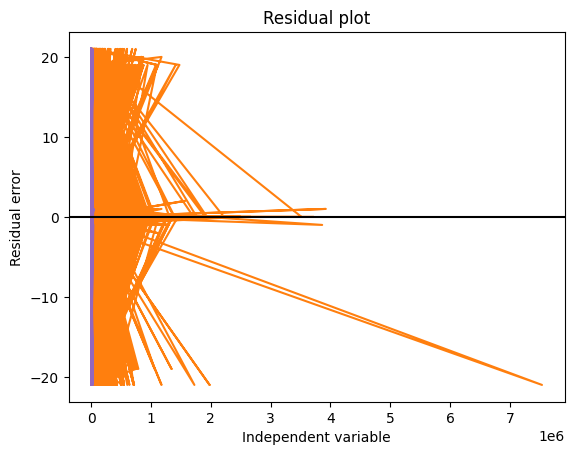

In [77]:
import matplotlib.pyplot as plt

plt.plot(X_test, residual_error)
plt.xlabel('Independent variable')
plt.ylabel('Residual error')
plt.axhline(0, color='black')
plt.title('Residual plot')
plt.show()

**Lurning Curve**

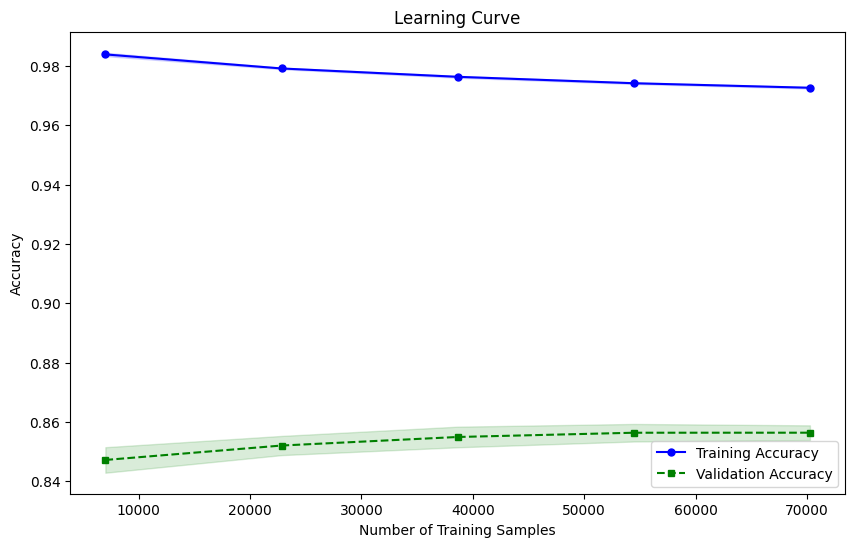

In [78]:
import numpy as np
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(rfc_100, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.15, color='blue')

plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.15, color='green')

plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.title('Learning Curve')
plt.legend()
plt.show()

**Regularization**

In [80]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming X_train, X_test, y_train, y_test are defined

# Create a Random Forest Classifier with regularization (adjust alpha)
rfc_regularized = RandomForestClassifier(n_estimators=100, random_state=42, min_samples_split=5, min_samples_leaf=2, max_depth=10)

# Train the regularized model on the training data
rfc_regularized.fit(X_train, y_train)

# Make predictions on the testing data
y_pred_regularized = rfc_regularized.predict(X_test)

# Evaluate the regularized model's accuracy
accuracy_regularized = accuracy_score(y_test, y_pred_regularized)
print(f'Regularized Model Accuracy: {accuracy_regularized:.4f}')

Regularized Model Accuracy: 0.8702


In [82]:
# Classification Report
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_regularized))

              precision    recall  f1-score   support

           1       0.90      0.88      0.89     12978
           2       0.93      0.88      0.90     13181
           3       0.82      0.83      0.83      8362
          22       0.79      0.88      0.84      8734

    accuracy                           0.87     43255
   macro avg       0.86      0.87      0.86     43255
weighted avg       0.87      0.87      0.87     43255



**Learning Curve for Regularized Model**

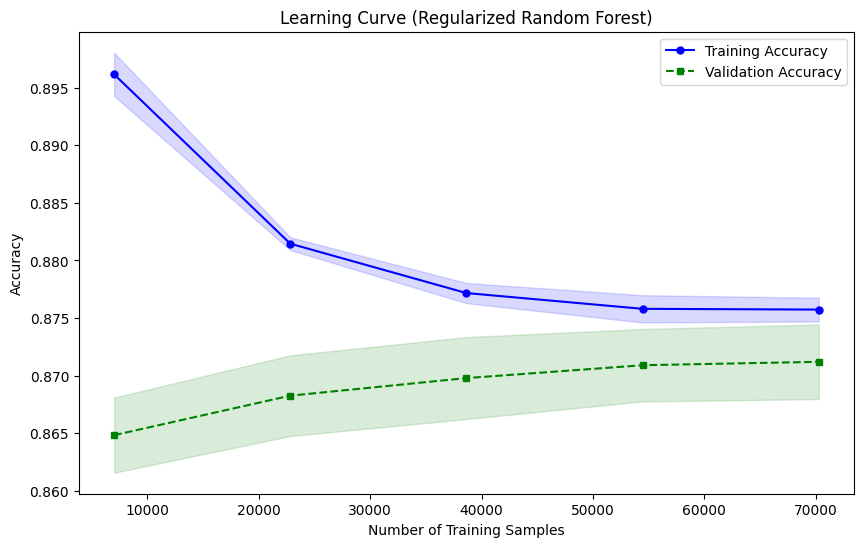

In [84]:
from sklearn.model_selection import learning_curve
import numpy as np
import matplotlib.pyplot as plt

# Assuming X_train, X_test, y_train, y_test are defined

# Create a Random Forest Classifier with regularization
rfc_regularized = RandomForestClassifier(n_estimators=100, random_state=42, min_samples_split=5, min_samples_leaf=2, max_depth=10)

# Get the learning curve
train_sizes, train_scores, test_scores = learning_curve(rfc_regularized, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)

# Calculate mean and standard deviation for training and test sets
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.15, color='blue')

plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation Accuracy')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.15, color='green')

plt.xlabel('Number of Training Samples')
plt.ylabel('Accuracy')
plt.title('Learning Curve (Regularized Random Forest)')
plt.legend()
plt.show()

**Regularized Random Forest Classifier and Model Evaluation**

In [86]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.metrics import accuracy_score
import numpy as np

# Assuming X_train, X_test, y_train, y_test are defined

# Create a Random Forest Classifier with regularization
rfc_regularized = RandomForestClassifier(n_estimators=100, random_state=42, min_samples_split=5, min_samples_leaf=2, max_depth=10)

# Train the regularized model on the training data
rfc_regularized.fit(X_train, y_train)

# Make predictions on the testing data
y_pred_regularized = rfc_regularized.predict(X_test)

# Evaluate the regularized model's accuracy on the test set
accuracy_regularized = accuracy_score(y_test, y_pred_regularized)
print(f'Regularized Model Accuracy on Test Set: {accuracy_regularized:.4f}')

# Cross-Validation Scores
cv = KFold(n_splits=5, shuffle=True, random_state=42)  # Adjust n_splits and other parameters as needed
cross_val_scores = cross_val_score(rfc_regularized, X_train, y_train, cv=cv, scoring='accuracy')

# Calculate Mean and Standard Deviation of Cross-Validation Scores
mean_cv_accuracy = np.mean(cross_val_scores)
std_cv_accuracy = np.std(cross_val_scores)

print(f'Cross-Validation Scores: {cross_val_scores}')
print(f'Mean Cross-Validation Accuracy: {mean_cv_accuracy:.4f}')
print(f'Standard Deviation of Cross-Validation Accuracy: {std_cv_accuracy:.4f}')

# Training Accuracy
y_pred_train = rfc_regularized.predict(X_train)
accuracy_train = accuracy_score(y_train, y_pred_train)
print(f'Training Accuracy: {accuracy_train:.4f}')

Regularized Model Accuracy on Test Set: 0.8702
Cross-Validation Scores: [0.86865179 0.87178319 0.87314962 0.87235254 0.8676839 ]
Mean Cross-Validation Accuracy: 0.8707
Standard Deviation of Cross-Validation Accuracy: 0.00
Training Accuracy: 0.8752
